# Latent Space Variational Geologic  Inversion from Multi-Source Dynamic Data
### Misael M. Morales, 2023
***

In [1]:
# Load my project packages
from utils_2d import *
K.clear_session()

2024-03-19 16:04:18.862573: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-19 16:04:18.862656: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-19 16:04:18.904504: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-19 16:04:18.992664: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-19 16:04:20.092536: W tensorflow/compiler/tf2

In [2]:
# Check tensorflow GPU settings
check_tensorflow_gpu()

Tensorflow built with CUDA? True
Tensorflow version: 2.15.0
# GPU available: 1
CUDA: 12.2 | cuDNN: 8
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


***
# Load all data and Visualize

In [16]:
### Load individual datasets from simulations
timestamps, poro, perm, channels, pressure, saturation, well_opr, well_wpr, well_wcut = load_initial_data()

Perm: (1000, 128, 128) | Poro: (1000, 128, 128) | Channels: (1000, 128, 128) | Pressure: (1000, 45, 128, 128) | Saturation: (1000, 45, 128, 128)
OPR: (1000, 45, 3) | WPR: (1000, 45, 3) | WCUT: (1000, 45, 3) | Timestamps: (45,)


In [ ]:
plot_static(poro, perm, channels)
plot_data(timestamps, well_opr, well_wpr, well_wcut)
plot_dynamic(poro, saturation, multiplier=10, cmaps=['viridis','jet'])
# make_dynamic_animation(poro, [pressure,saturation])

***
# Data Processing
Load pre-existing data

Normalization, concatenate features and targets, train-test split

In [3]:
### (a) To split and normalize data into (x,y,w):
# X_data, y_data, w_data = split_xyw(poro, perm, channels, pressure, saturation, well_opr, well_wpr, well_wcut)

### (b) To load pre-computed, normalized (X,y,w,t):
X_data, y_data, w_data, timestamps = load_xywt()

X shape: (1000, 45, 128, 128, 2) | w shape: (1000, 45, 3, 3) 
y shape: (1000, 128, 128, 3) | t shape: (45,)


In [4]:
# Perform train-test split
X_train, X_test, y_train, y_test, w_train, w_test, randx, randy = my_train_test_split(X_data, y_data, w_data, nobs=30)

X_train shape: (700, 45, 30, 2)   | X_test shape: (300, 45, 30, 2)
w_train shape: (700, 45, 3, 3)    | w_test shape: (300, 45, 3, 3)
y_train shape: (700, 128, 128, 3) | y_test shape: (300, 128, 128, 3)


In [ ]:
# Visualize X-samples
plot_X_img_observation(X_data, randx, randy)
plot_X_observation(X_train)
plot_X_line_observation(X_train, timestamps)

***
# Build, Compile, Train, and Predict with AutoEncoder Models
Run Train/Test Predictions

2024-03-19 16:05:56.786037: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: Permission denied
2024-03-19 16:05:56.962832: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-03-19 16:05:57.245723: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: Permission denied
2024-03-19 16:05:59.913071: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fb43f60a940 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-19 16:05:59.913116: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-03-19 16:05:59.924795: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1710882360.009571  246020 device_compiler.h:186] Compiled 

# Parameters: 40,238 | Training time: 2.98 minutes
# Parameters: 5,610,120 | Training time: 0.40 minutes
# Parameters: 308,025 | Training time: 0.33 minutes


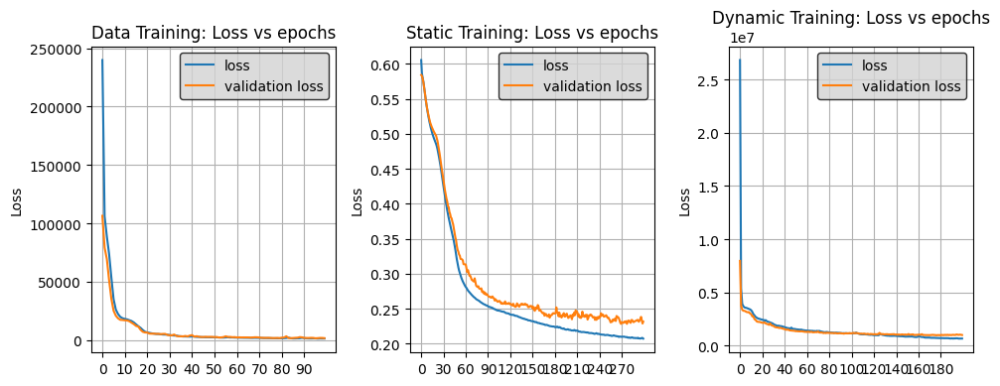

In [5]:
static_enc,  static_dec,  static_ae,  static_fit  = make_static_ae(y_train)
dynamic_enc, dynamic_dec, dynamic_ae, dynamic_fit = make_dynamic_ae(X_train)
data_enc,    data_dec,    data_ae,    data_fit    = make_data_ae(w_train)
plot_loss_all(data_fit, static_fit, dynamic_fit)

10/10 [==============================] - 0s 4ms/step
Train MSE: 5.75e-04 | Test MSE: 5.75e-04
Image data must have shape at least (7x7) for ssim calculation


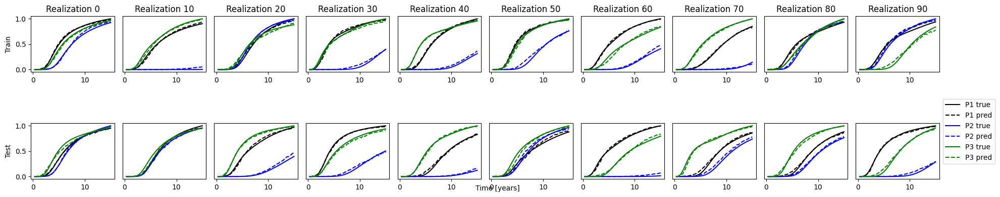

In [6]:
w_train_pred, w_test_pred = make_ae_prediction(w_train, w_test, data_ae)
plot_data_results(timestamps, w_train, w_test, w_train_pred, w_test_pred, channel_select=2, multiplier=10)

10/10 [==============================] - 0s 15ms/step
Train MSE: 2.90e-02 | Test MSE: 2.90e-02
Train SSIM: 83.73 | Test SSIM: 83.28


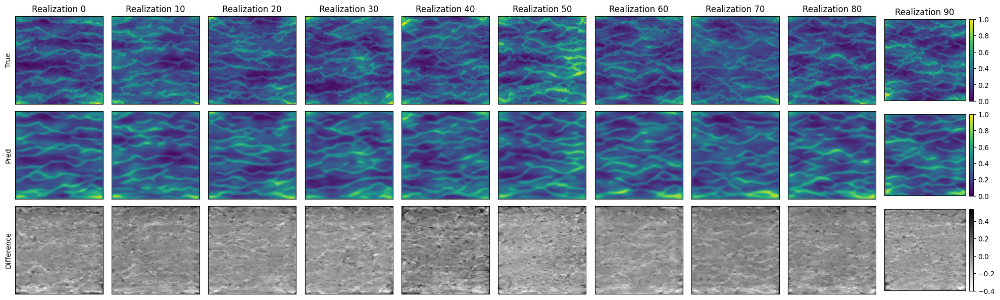

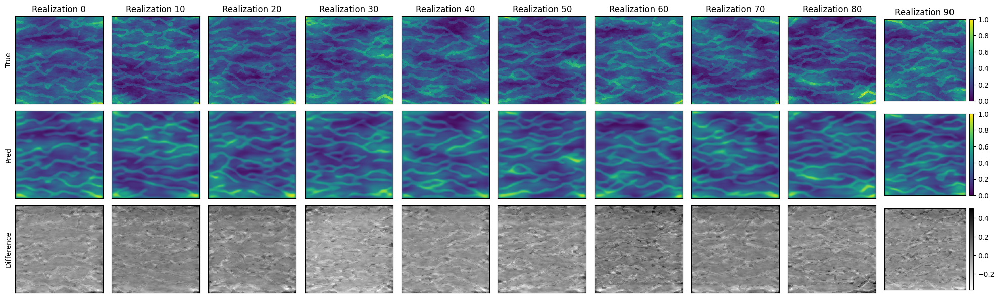

In [7]:
y_train_pred, y_test_pred = make_ae_prediction(y_train, y_test, static_ae)
plot_static_results(y_train, y_train_pred, multiplier=10, channel_select=0, cmaps=['viridis','gray_r'])
plot_static_results(y_test, y_test_pred, multiplier=10, channel_select=0, cmaps=['viridis','gray_r'])

10/10 [==============================] - 0s 9ms/step
Train MSE: 2.53e-03 | Test MSE: 2.53e-03
Train SSIM: 96.71 | Test SSIM: 94.83


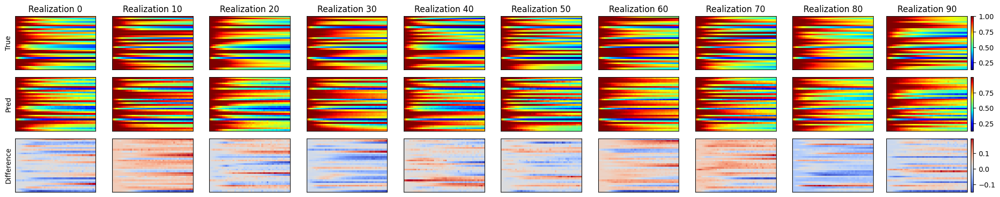

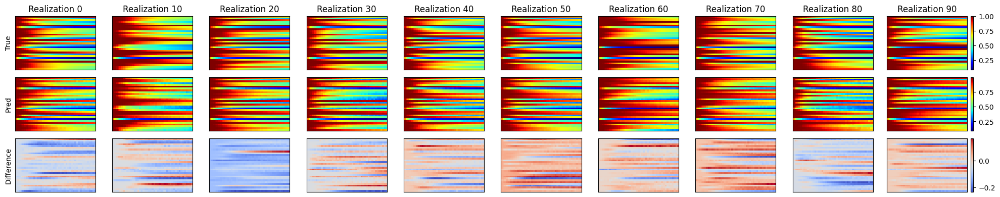

In [8]:
X_train_pred, X_test_pred = make_ae_prediction(X_train, X_test, dynamic_ae)
plot_dynamic_results(X_train, X_train_pred, multiplier=10, channel_select=1)
plot_dynamic_results(X_test, X_test_pred, multiplier=10, channel_select=1)

***
# Build, Compile, Train, and Predict with Latent-Inversion Network

In [9]:
X_full, w_full, y_full = make_full_traintest(X_train, X_test, w_train, w_test, y_train, y_test)

X_full: (1000, 45, 30, 2) | w_full: (1000, 45, 3, 3) | y_full: (1000, 128, 128, 3)


# Parameters: 62,959,895 | Training time: 4.32 minutes


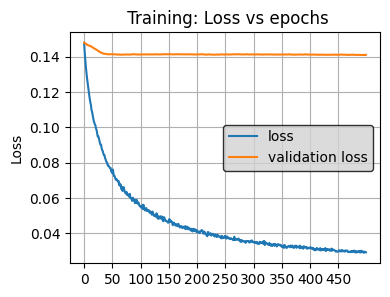

In [10]:
inv, inv_fit = make_inv_regressor(X_full, w_full, y_full, dynamic_enc, data_enc, static_dec)
plot_loss(inv_fit, figsize=(4,3))

In [11]:
inv_train, inv_test = make_inv_prediction(inv, [X_train, X_test], [w_train, w_test], [y_train, y_test])

10/10 [==============================] - 0s 14ms/step
Train MSE: 2.29e-02 | Test MSE: 1.02e-01
Train SSIM: 81.00 | Test SSIM: 37.53


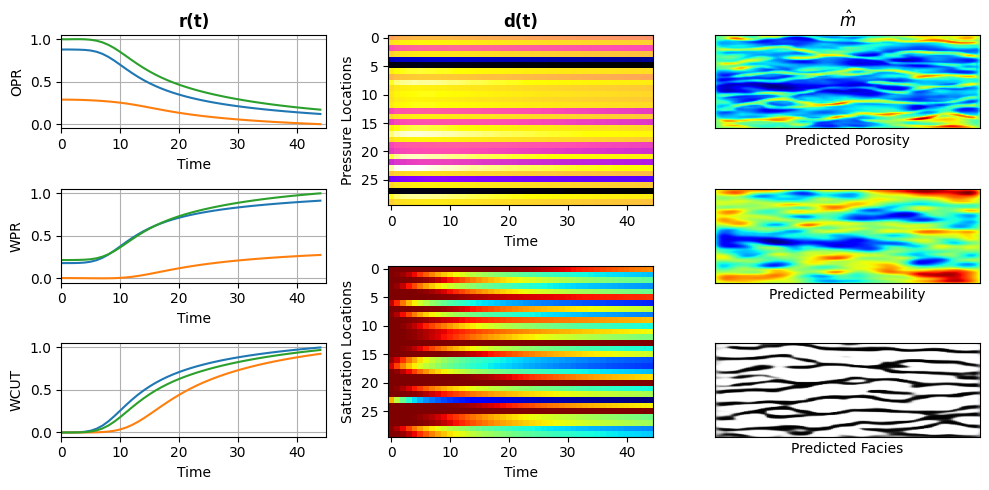

In [12]:
plot_inv_latent_dashboard(X_full, w_full, inv_train)

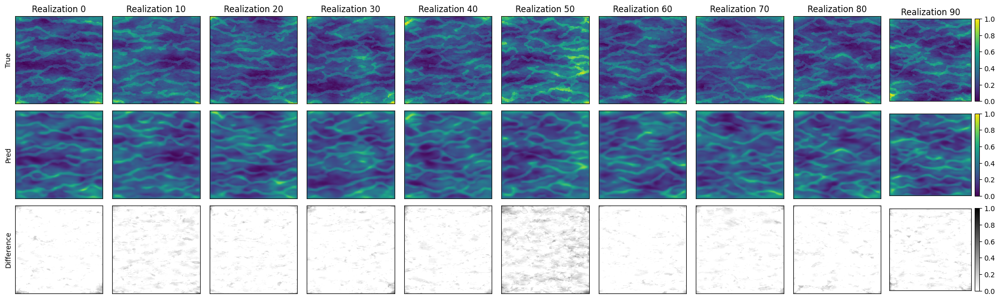

In [13]:
plot_inversion_result(y_train, inv_train, multiplier=10, channel_select=0, cmaps=['viridis','gray_r'])

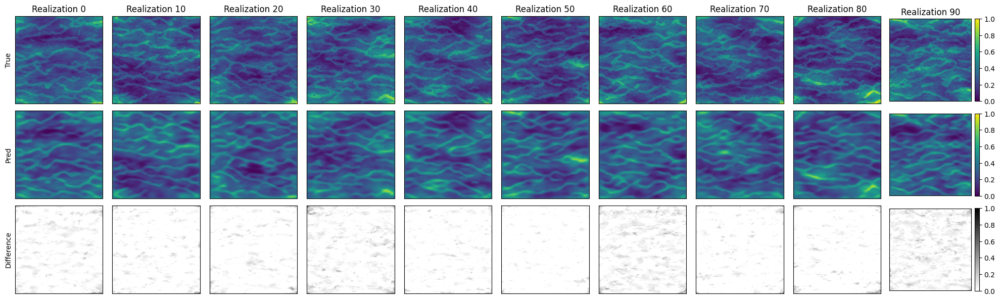

In [14]:
plot_inversion_result(y_test, inv_test, multiplier=10, channel_select=0, cmaps=['viridis','gray_r'])

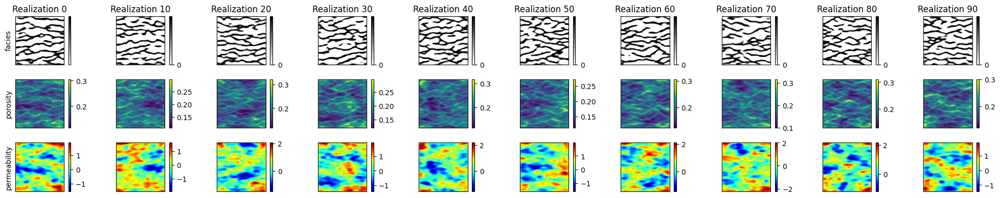

In [17]:
poro_hat, perm_hat, channels_hat = make_inv_backnorm([inv_train, inv_test], [poro, perm, channels])
plot_static(poro_hat, perm_hat, channels_hat, multiplier=10)

***
# Build, Compile, Train, and Predict with Latent-Forward Network

In [253]:
def make_fwd_regressor(xf, wf, yf, dynamic_dec, data_dec, static_enc, latent_dim=10,
                       opt=Adam(1e-3), epochs=100, batch=80):
    dynamic_dec.trainable = False
    data_dec.trainable    = False
    static_enc.trainable  = False

    def dense_block(input, neurons):
        _ = Dense(neurons)(input)
        _ = LayerNormalization()(_)
        _ = BatchNormalization()(_)
        _ = PReLU()(_)
        return _
    
    def sample(args, mu=0.0, std=1.0):
        mean, sigma = args
        epsilon = K.random_normal(shape=(K.shape(mean)[0], latent_dim), mean=mu, stddev=std)
        return mean + K.exp(sigma) * epsilon
    
    y_inp = Input(shape=(yf.shape[1:]))
    y_latent = static_enc(y_inp)
    
    x_mu = Dense(latent_dim)(y_latent)
    x_sd = Dense(latent_dim)(y_latent)
    x_z = Lambda(sample)([x_mu, x_sd])

    w_mu = Dense(latent_dim)(y_latent)
    w_sd = Dense(latent_dim)(y_latent)
    w_z = Lambda(sample)([w_mu, w_sd])
    
    x_inp = Input(shape=(xf.shape[1:]))
    x_out = dynamic_dec(x_z)

    w_inp = Input(shape=(wf.shape[1:]))
    w_out = data_dec(w_z)

    fwd = Model([x_inp, w_inp, y_inp], [x_out, w_out])

    x_mse = K.sum(loss_mse(x_inp, x_out))*np.prod(xf.shape[1:])
    x_kl_loss = -0.5 * K.sum(1 + x_sd - K.square(x_mu) - K.exp(x_sd), axis=-1)
    x_loss = K.mean(x_mse + x_kl_loss)

    w_mse =  K.sum(loss_mse(w_inp, w_out))*np.prod(wf.shape[1:])
    w_kl_loss = -0.5 * K.sum(1 + w_sd - K.square(w_mu) - K.exp(w_sd), axis=-1)
    w_loss = K.mean(w_mse + w_kl_loss)

    loss = K.mean(x_loss + w_loss)
    fwd.add_loss(loss)

    rparams = fwd.count_params()
    fwd.compile(optimizer=opt, metrics=['mse'])
    start = time()
    fit = fwd.fit([xf,wf,yf], [xf, wf], epochs=epochs, batch_size=batch, verbose=0, validation_split=0.2)
    traintime = (time()-start)/60
    print('# Parameters: {:,} | Training time: {:.2f} minutes'.format(rparams, traintime))
    return fwd, fit

# Parameters: 3,306,944 | Training time: 0.84 minutes


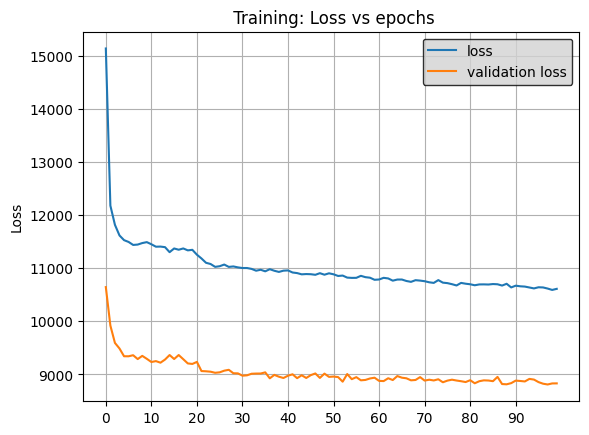

In [254]:
fwd, fwd_fit = make_fwd_regressor(X_full, w_full, y_full, dynamic_dec, data_dec, static_enc)
plot_loss(fwd_fit)

In [255]:
fwd_X, fwd_w = make_fwd_prediction(fwd, [X_train, X_test], [w_train, w_test], [y_train, y_test])

10/10 [==============================] - 0s 21ms/step
X - MSE: Train 2.92e-02 | Test: 2.90e-02
w - MSE: Train 4.25e-02 | Test: 4.36e-02


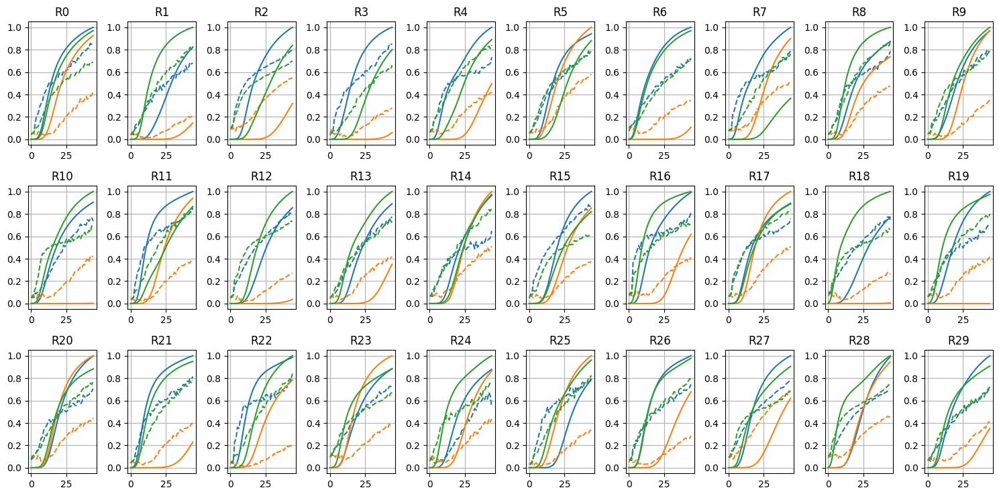

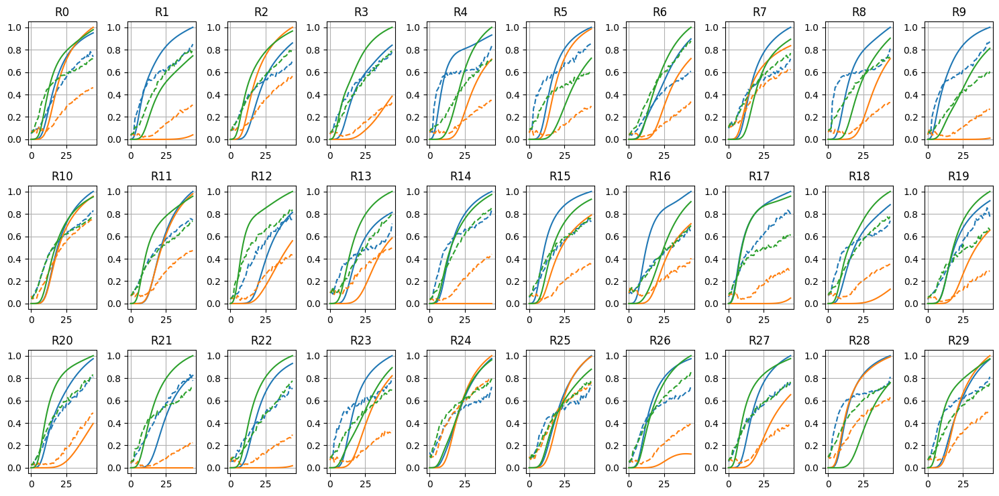

In [256]:
plot_fwd_results_data(w_train, fwd_w['train'])
plot_fwd_results_data(w_test, fwd_w['test'])

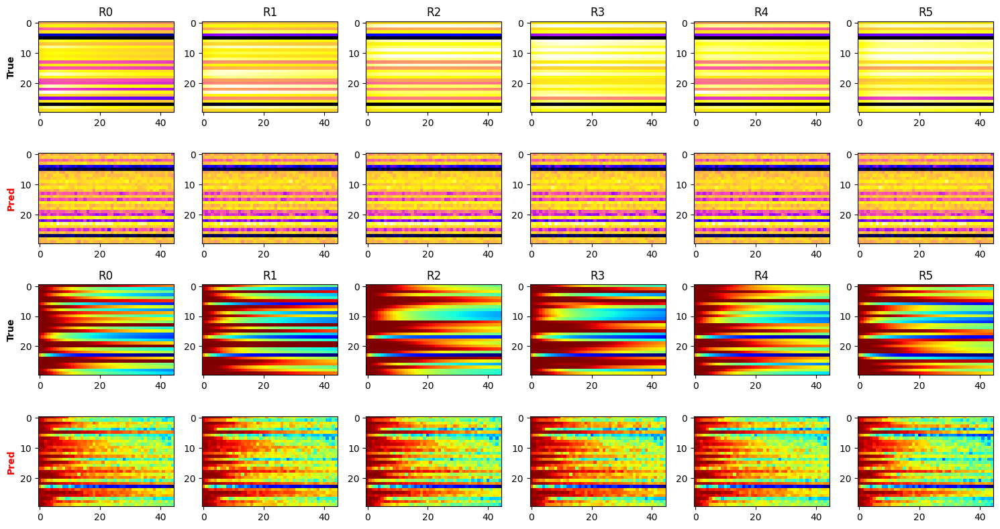

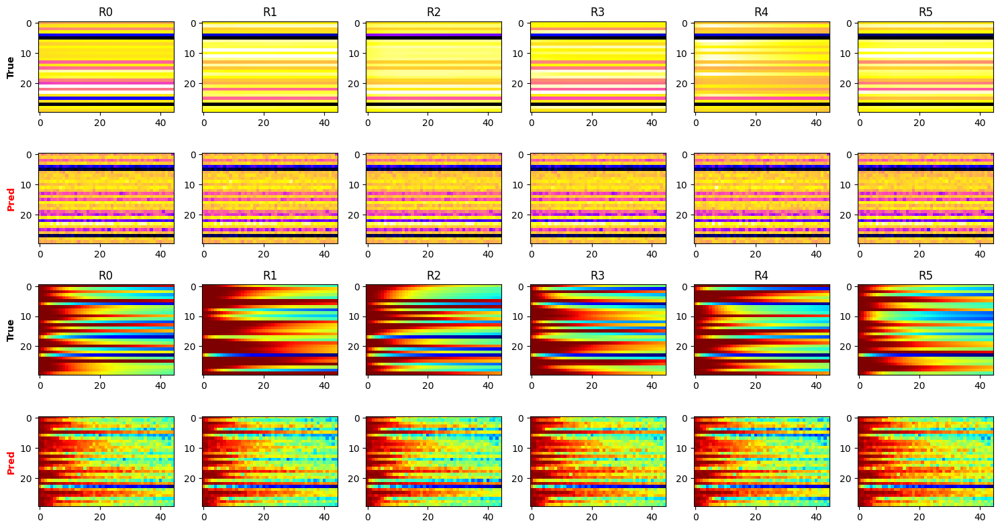

In [257]:
plot_fwd_results_dynamic(X_train, fwd_X['train'])
plot_fwd_results_dynamic(X_test, fwd_X['test'])

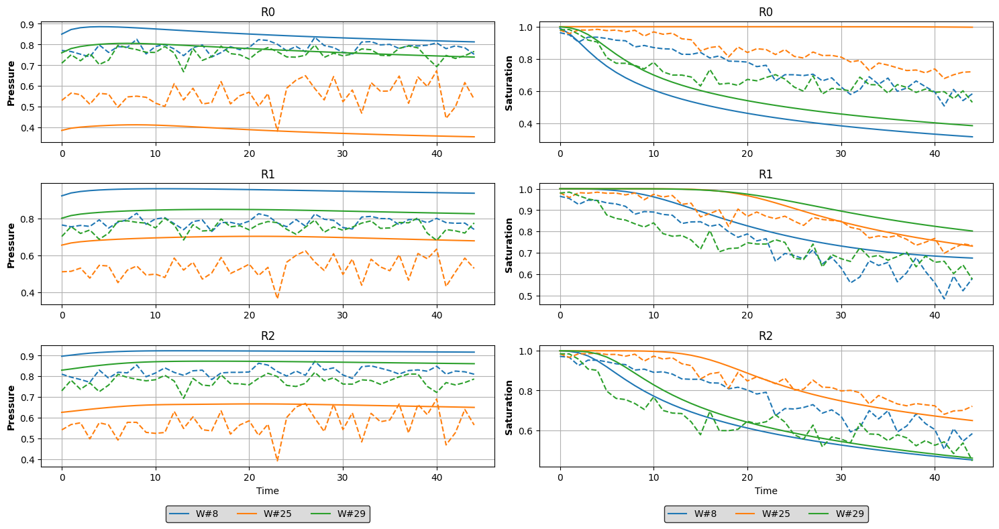

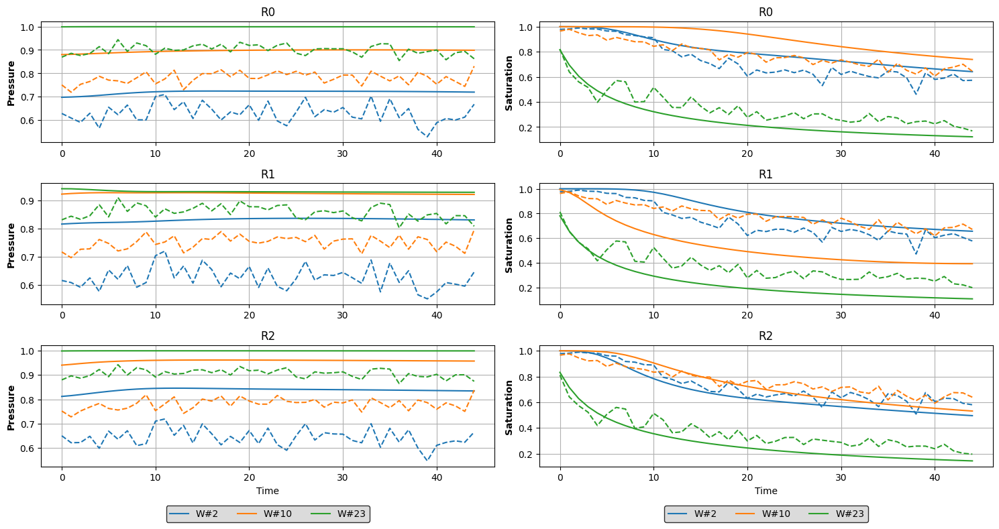

In [258]:
plot_fwd_results_dynamic_line(X_train, fwd_X['train'], nw=3)
plot_fwd_results_dynamic_line(X_test, fwd_X['test'], nw=3)

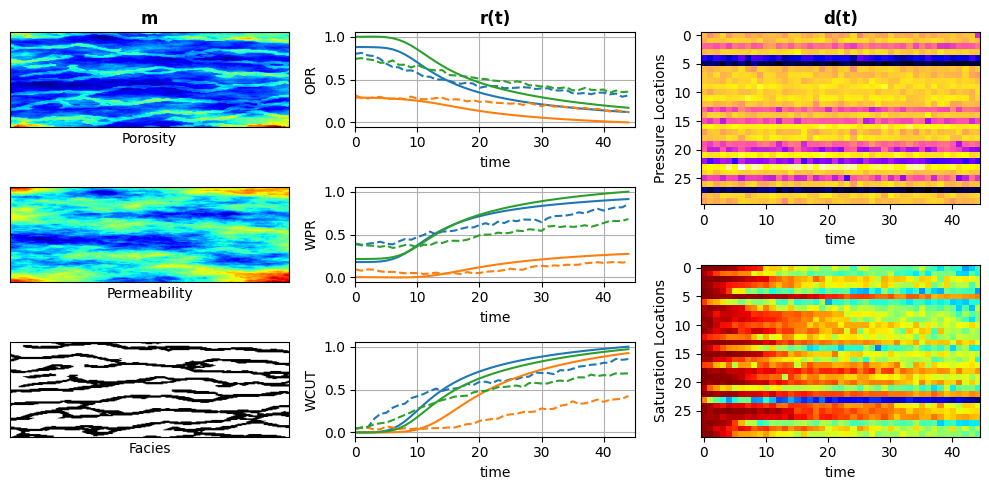

In [259]:
plot_fwd_latent_dashboard(w_full, y_full, fwd_X['train'], fwd_w['train'])

In [260]:
spatial_fwdX = fwd_latent_spatial_interpolation(fwd_X, locs=[randx,randy], train_or_test='train', n_obs=100)

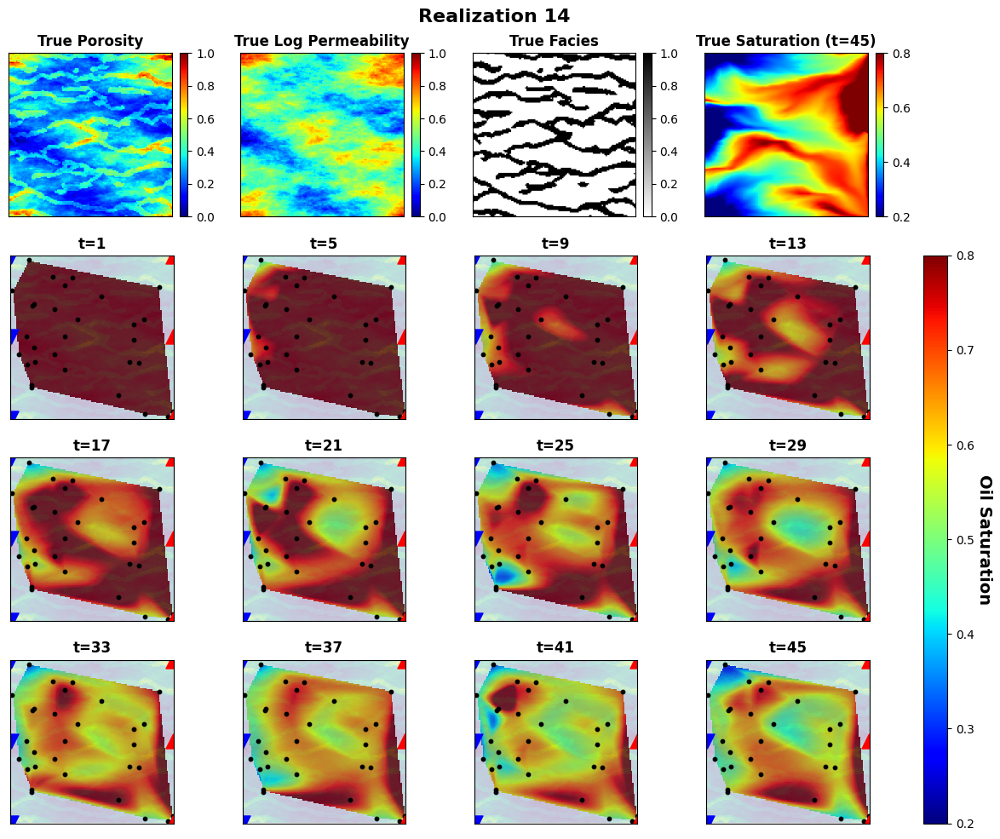

In [261]:
plot_fwd_latent_map(spatial_fwdX, y_train, X_data, locs=[randx, randy], realization=14)

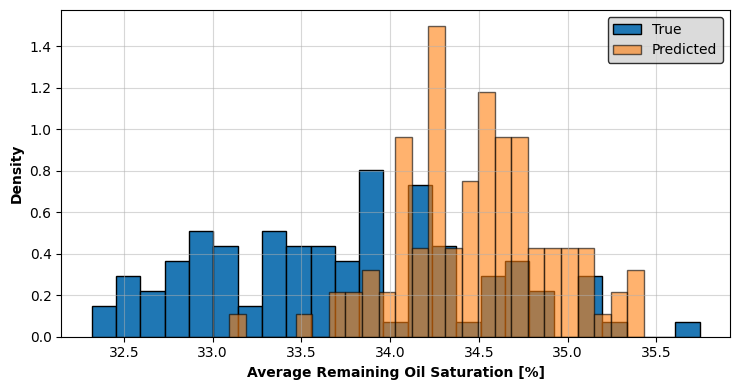

In [262]:
plot_fwd_resoil(X_data, spatial_fwdX, correction=0.8)

***
### Save models

In [ ]:
save_models([static_enc,dynamic_enc,data_enc], 
            [static_dec,dynamic_dec,data_dec],
            [static_ae,dynamic_ae,data_ae],
            [inv, fwd])

***
# END